# 2018 LendingClub Loan Data: Loan Classifier

In [1]:
%matplotlib inline
import time
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import modules.global_plot_functions as gp 
import lime
from lime import lime_tabular
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

sns.set()
pd.set_option('display.max_columns', 150)     # max number of columns to be shown
mpl.rcParams['axes.titlesize'] = 17           # font size for plot title
mpl.rcParams['axes.labelsize'] = 14           # font size for x-axis' and y-axis' label

## RandomForestClassifier

RandomForestClassifier works well with outliers. The model constructs multiple decision trees and compute the score for each tree. Each tree predicts the target variable using a random subset of the available predictors and a random sample of the available data. The tree with the highest score is selected and its' result is used as a predictor. 

In [2]:
class LoanClassifier:
    '''
    Use RandomForestClassifier to classified a loan as fully-paid or default.
    '''
    
    def __init__(self, model_name, param, features):
        '''
        Initialize and create model.
        
        Parameters:
        - model_name: name of the model
        - param: a dictionary of parameters for grid search
        - features: a list of features to be used in the model
        '''
        
        self.model_name = model_name
        self.model = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                                  param_grid=param, cv=3, n_jobs=-1, verbose=2)
        self.features = features
        self.feature_imp = self.metrics = None
        self.y_predict = self.predict_proba = None
        self.explainer = None
        self.predict_fn_rf = lambda x: self.model.predict_proba(x).astype(float)
    
    def train_n_evaluate(self, X_train, y_train, X_test, y_test):
        '''
        Train and evaluate model.
        
        parameters:
        - X_train: training set
        - y_train: class label for training set
        - X_test: test set
        - y_test: class label for test set
        '''
        
        start_time = time.time()
        self.model.fit(X_train, y_train)                                # fit the model
        stop_time = time.time()
        self.y_predict = self.model.predict(X_test)                     # predictions for test set
        self.predict_proba = self.model.predict_proba(X_test)           # prediction' probability
        c_matrix = metrics.confusion_matrix(y_test, self.y_predict)     # confusion matrix
        
        # build a dictionary of performance metrics
        metrics_dict = {'model_name': self.model_name,
                        'true_neg': c_matrix[0][0],
                        'true_pos': c_matrix[1][1],
                        'false_neg': c_matrix[1][0],
                        'false_pos': c_matrix[0][1],
                        'accuracy': metrics.accuracy_score(y_test, self.y_predict),
                        'precision': metrics.precision_score(y_test, self.y_predict),
                        'recall': metrics.recall_score(y_test, self.y_predict),
                        'f1_score': metrics.f1_score(y_test, self.y_predict),
                        'training_time': round(stop_time - start_time)}
        self.metrics = pd.DataFrame(metrics_dict, index=[0])
        
        # sort feature importance in descending order
        self.feature_imp = pd.Series(self.model.best_estimator_.feature_importances_, 
                                index=self.features).sort_values(ascending=False)
    
        # create explainer to help explain the prediction
        self.explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names = X_train.columns,
                                              class_names=['Fully-Paid', 'Default'], kernel_width=5)
    
    def explain_prediction(self, row, num_features=5):
        '''
        Show horizontal bar plot of prediction's probability along with the score for the top 5 features.
        
        Parameters:
        - row: row's number in the test set
        - num_features: the number of top features to show along with its' score
        '''
        
        # show prediction and explanation, show the top 5 features
        exp = self.explainer.explain_instance(row, self.predict_fn_rf, num_features=num_features)
        exp.show_in_notebook(show_all=False)
        return exp
    
    def plot_feature_importance(self, figsize=(6, 6)):
        '''
        Create a bar plot of feature importance
        
        Parameter:
        - figsize: size of the figure
        '''
        
        fig, ax = plt.subplots(figsize=figsize)
        
        # create a bar plot of feature importance
        sns.barplot(x=self.feature_imp, y=self.feature_imp.index)

        # add labels to graph
        plt.xlabel('Score')
        plt.ylabel('Features')
        plt.title('Feature Importance')
        plt.show()

In [3]:
# load train and test dataset
X_train = pd.read_pickle('out/X_train.pkl')
X_test = pd.read_pickle('out/X_test.pkl')
y_train = pd.read_pickle('out/y_train.pkl')
y_test = pd.read_pickle('out/y_test.pkl')

X = pd.concat([X_train, X_test])
X_train = X_train.drop(['months_in_loan'], axis=1)
X_test = X_test.drop(['months_in_loan'], axis=1)

# parameters for base model and reduced features model
param = {'bootstrap': [True], 'n_estimators': [100]}

## Base Model

In [4]:
base_model = LoanClassifier('base_model', param, list(X_train.columns))
base_model.train_n_evaluate(X_train, y_train, X_test, y_test)
base_model.metrics

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   30.4s finished


,model_name,true_neg,true_pos,false_neg,false_pos,accuracy,precision,recall,f1_score,training_time
0,base_model,22708,218,4868,171,0.81981,0.560411,0.042863,0.079635,60


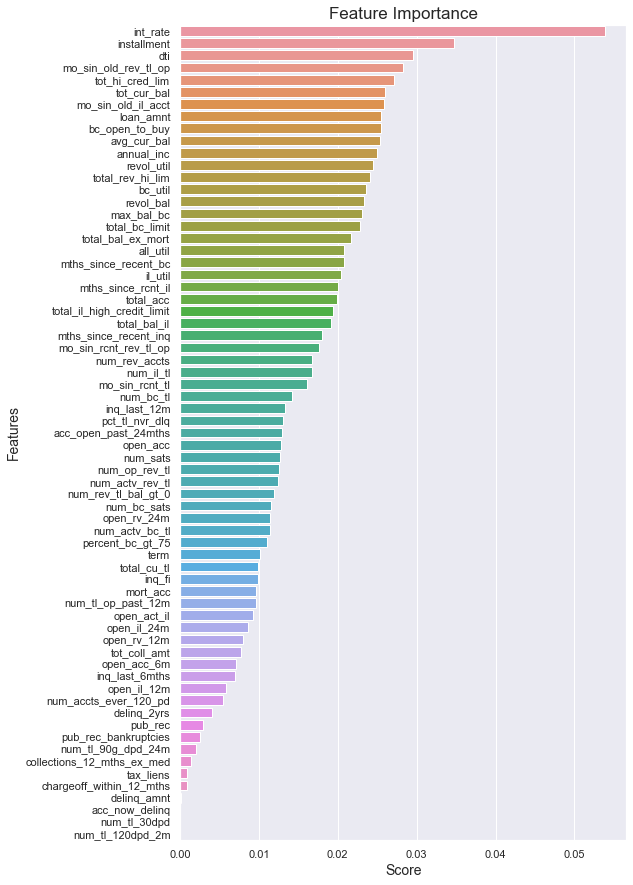

In [5]:
base_model.plot_feature_importance((8, 15))

## Model with Reduced Features

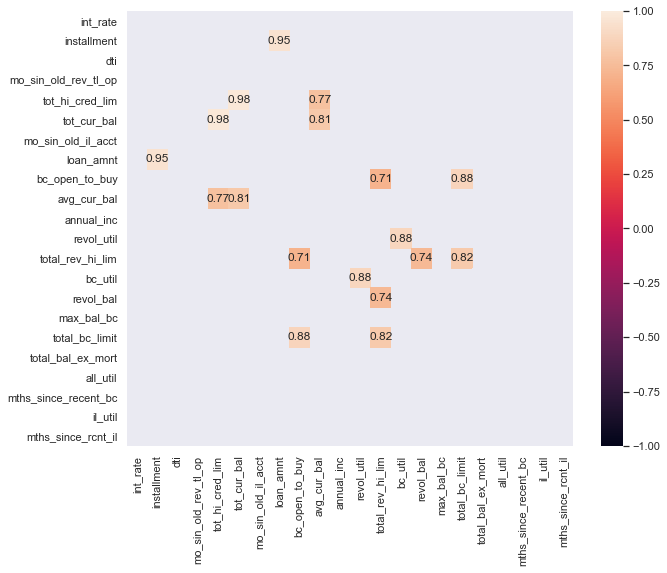

In [6]:
# select features with important score > 0.02
features_gt_2 = list(base_model.feature_imp[base_model.feature_imp > 0.02].index)

# create heat map of correlation
fig, ax = plt.subplots(figsize=(10, 8))
corr = X[features_gt_2].corr()

strong_corr = corr >= 0.7     # get features with correlation score >= 0.7
exclude_one = corr != 1       # exclude the ones with correlation score of 1 (self-correlation)
corr = corr[strong_corr & exclude_one]
sns.heatmap(corr, vmin=-1, vmax=1, annot=True)
plt.show()

In [7]:
# remove strong correlated features
features_m1 = list(set(features_gt_2) - set(['tot_hi_cred_lim', 'loan_amnt', 'bc_util', 'total_rev_hi_lim', 
                                'tot_cur_bal', 'total_bal_ex_mort']))

model1 = LoanClassifier('feature_reduction', param, features_m1)
model1.train_n_evaluate(X_train[features_m1], y_train, X_test[features_m1], y_test)
model1.metrics

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   22.6s finished


,model_name,true_neg,true_pos,false_neg,false_pos,accuracy,precision,recall,f1_score,training_time
0,feature_reduction,22623,252,4834,256,0.817987,0.496063,0.049548,0.090097,46


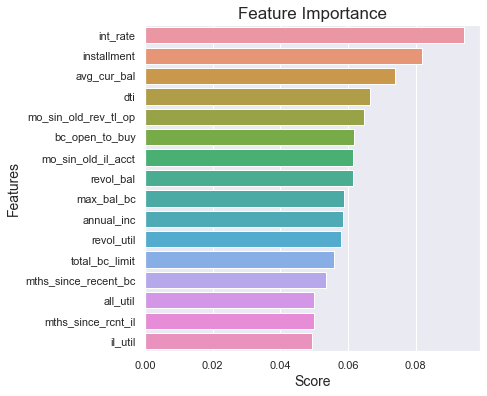

In [8]:
model1.plot_feature_importance()

## Model with Grid Search and Reduced Features

In [9]:
param_grid = {'bootstrap': [True],
              'max_depth': [10, 20, 30],
              'max_features': ['sqrt'],
              'min_samples_leaf': [5, 6, 7],
              'min_samples_split': [6, 8, 10],
              'n_estimators': [80, 100, 120]}

model2 = LoanClassifier('grid_search', param_grid, features_m1)
model2.train_n_evaluate(X_train[features_m1], y_train, X_test[features_m1], y_test)
model2.metrics

Fitting 3 folds for each of 81 candidates, totalling 243 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 243 out of 243 | elapsed: 23.1min finished


,model_name,true_neg,true_pos,false_neg,false_pos,accuracy,precision,recall,f1_score,training_time
0,grid_search,22704,208,4878,175,0.81931,0.543081,0.040897,0.076065,1406


In [10]:
model2.model.best_params_

{'bootstrap': True,
 'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_leaf': 7,
 'min_samples_split': 6,
 'n_estimators': 80}

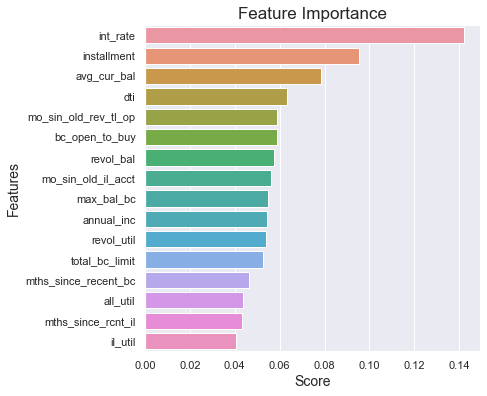

In [11]:
model2.plot_feature_importance()

## Model Comparison

### Receiver Operating Characteristics Curve (ROC Curve)

ROC curve shows the trade-off between the true positive rate (TPR) and the false positive rate (FPR). Any increase in TPR occurs at the cost of an increase in FPR. The area under the ROC curve is a measure of the accuracy of the model.

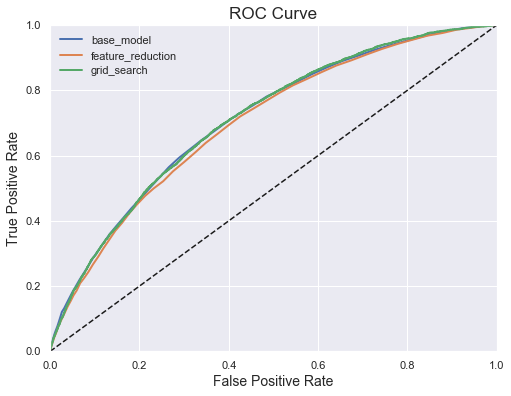

In [12]:
# plot roc curve for all models
fig, ax = plt.subplots(figsize=(8, 6))
labels = ['base_model', 'feature_reduction', 'grid_search']

# iterate through all the models and plot roc curve for each model
for i, model in enumerate([base_model, model1, model2]):
    fpr, tpr, _ = metrics.roc_curve(y_test, model.predict_proba[:,1])
    plt.plot(fpr, tpr, linewidth=2, label=labels[i])

plt.legend(loc='best', frameon=False)
plt.plot([0, 1], [0, 1], 'k--')
plt.axis([0, 1, 0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

ROC curves appear to be overlapped. It looks like the base model and model 2 (grid search) performs slightly better than model 1 (feature_reduction).

### Performance Metrics

The model is evaluated using the following performance metrics:

- __Accuracy__ (recognition rate): $\frac{TP + TN}{P + N}$
- __Error Rate__ (misclassification rate): $\frac{FP + FN}{P + N}$ or 1 - Accuracy
- __Sensitivity__ (true positive rate, recall): $\frac{TP}{P}$
- __Specificity__ (true negative rate): $\frac{TN}{N}$
- __Precision__: $\frac{TP}{TP + FP}$
- __F, $F_1$, F-score__ (harmonic mean of precision and recall): $\frac{2 * precision * recall}{precision + recall}$

where

- __P__ (Positive): number of default loans (positive cases)
- __N__ (Negative): number of fully-paid loans (negative cases)
- __TP__ (True Positives): number of observations that were correctly labeled as default
- __TN__ (True Negatives): number of observations that were correctly labeled as fully-paid
- __FP__ (False Positives): number of observations that were incorrectly labeled as default
- __FN__ (False Negatives): number of observations that were incorrectly labeled as fully-paid

In [13]:
# a data frame that contains performance metrics for all model
metrics_all = pd.concat([base_model.metrics, model1.metrics, model2.metrics])

metrics_all

,model_name,true_neg,true_pos,false_neg,false_pos,accuracy,precision,recall,f1_score,training_time
0,base_model,22708,218,4868,171,0.819810,0.560411,0.042863,0.079635,60
0,feature_reduction,22623,252,4834,256,0.817987,0.496063,0.049548,0.090097,46
0,grid_search,22704,208,4878,175,0.819310,0.543081,0.040897,0.076065,1406


- The accuracy score is almost the same for all models.
- __Base Model__ use all the features in the dataset. Therefore, it is likely to overfit.
- __Model 1__ (feature_reduction) has ___highest true positive rate___, ___highest recall___ and ___f1_score___, and ___lowest training time___. 
- __Model 2__ (grid search) has lowest true positive rate, recall rate, and f1 score. It also took a longest time to train.

Therefore, __model 1__ is selected as a loan classifier.

## Model Prediction

In [14]:
test_fp = X_test.iloc[0]                                                      # obs being predicted as fully-paid
test_df = X_test.loc[y_test[base_model.predict_proba[:, 1] > 0.8].index[0]]   # obs being predicted as default

### Fully-Paid

In [15]:
print('Base Model')
_ = base_model.explain_prediction(test_fp.values)

Base Model


In [16]:
print('Model 1 with Reduced Features')
_ = model1.explain_prediction(test_fp[features_m1].values)

Model 1 with Reduced Features


In [17]:
print('Model 2 with Reduced Features and Grid Search')
_ = model2.explain_prediction(test_fp[features_m1].values)

Model 2 with Reduced Features and Grid Search


### Default

In [18]:
print('Base Model')
_ = base_model.explain_prediction(test_df.values)

Base Model


In [19]:
print('Model 1 with Reduced Features')
_ = model1.explain_prediction(test_df[features_m1].values)

Model 1 with Reduced Features


In [20]:
print('Model 2 with Reduced Features and Grid Search')
exp2 = model2.explain_prediction(test_df[features_m1].values)

Model 2 with Reduced Features and Grid Search


## Model Predictions

In [21]:
# Making prediction with selected model (model 1)
best_model = model1
rf_predictions = pd.concat([X_test[['loan_amnt', 'installment']]])
rf_predictions['actual_label'] = y_test
rf_predictions['predict_label'] = best_model.y_predict
rf_predictions['prob_fully_paid'] = best_model.predict_proba[:,0]      # probability of fully-paid
rf_predictions['prob_default'] = best_model.predict_proba[:, 1]        # probability of default
rf_predictions.head()

,loan_amnt,installment,actual_label,predict_label,prob_fully_paid,prob_default
62443,15000.0,464.60,0,0,0.92,0.08
18517,2500.0,80.02,0,0,0.90,0.10
88924,24000.0,854.60,1,0,0.55,0.45
71372,36000.0,792.64,0,0,0.58,0.42
48853,5000.0,188.10,0,0,0.60,0.40


## Save Predictions

In [22]:
import pickle

rf_predictions.to_pickle('out/lc_predictions.pkl')     # save predictions